#Grupo

Edgard Henrique Coelho Tavares da Silva

Gabriel Vieira

Gustavo Henrique de Carvalho

João Victor Silva


In [ ]:
!pip install elevation
!pip install rioxarray geopandas folium whitebox
!apt-get install -y gdal-bin python3-gdal


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from datetime import datetime, timedelta

# Plotly
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# TensorFlow / Keras
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

# Scikit-learn
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    confusion_matrix,
    classification_report
)

# Geo e Raster
import geopandas as gpd
from shapely.geometry import Point, Polygon, shape
import rasterio
from rasterio.features import shapes
import rioxarray
import elevation
from whitebox import WhiteboxTools

# Folium
import folium
from folium import plugins
from folium.plugins import HeatMap

from scipy.ndimage import minimum_filter, generic_filter


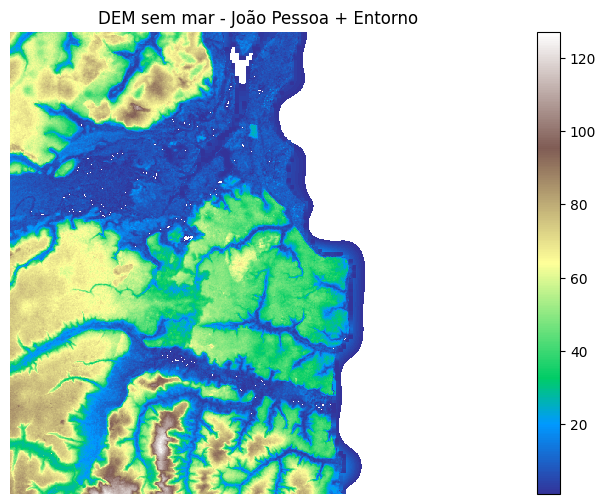

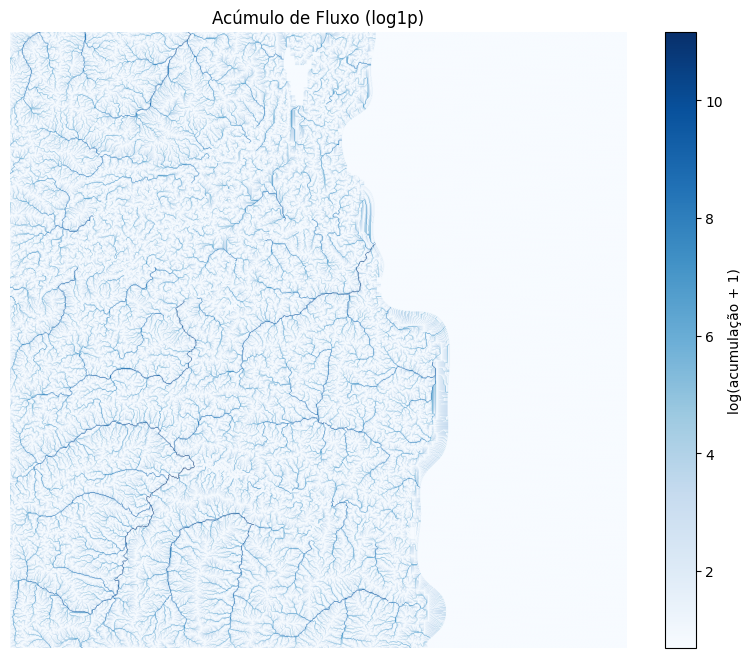

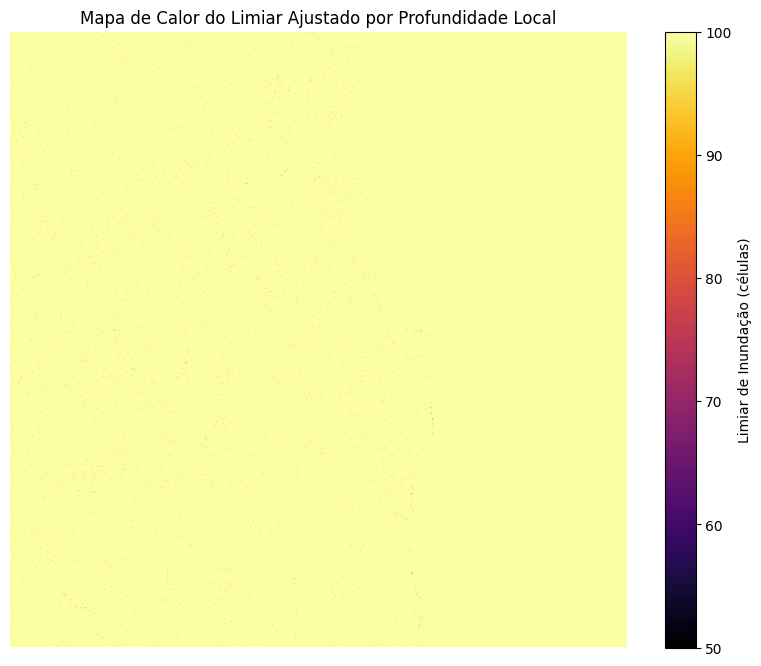

In [ ]:
bounds = [-35.00, -7.30, -34.70, -7.00]  # (min lon, min lat, max lon, max lat)

elevation.clip(bounds=bounds, output='/content/dem_jp.tif')

dem = rioxarray.open_rasterio('/content/dem_jp.tif', masked=True)
dem = dem.squeeze()  # Remove dimensão extra
terra_mask = dem > 0
dem = dem.where(terra_mask)

dem.rio.to_raster('/content/dem_sem_mar.tif')

plt.figure(figsize=(8, 6))
dem.plot(cmap='terrain')
plt.title('DEM sem mar - João Pessoa + Entorno')
plt.axis('off')
plt.show()

wbt = WhiteboxTools()
wbt.verbose = False

wbt.fill_depressions('/content/dem_sem_mar.tif', '/content/dem_filled.tif')

wbt.d8_pointer('/content/dem_filled.tif', '/content/flow_dir.tif')

wbt.d8_flow_accumulation('/content/dem_filled.tif', '/content/flow_accum.tif', out_type='cells')

with rasterio.open('/content/flow_accum.tif') as src:
    flow_accum_data = src.read(1)
    flow_profile = src.profile

plt.figure(figsize=(10, 8))
plt.imshow(np.log1p(flow_accum_data), cmap='Blues')
plt.title('Acúmulo de Fluxo (log1p)')
plt.colorbar(label='log(acumulação + 1)')
plt.axis('off')
plt.show()


precipitacao_manual = 100

kernel = np.ones((3, 3))
def depth_relative(values):
    center = values[4]
    neighbors = np.delete(values, 4)
    return max(0, np.min(neighbors) - center)

relief_depth = generic_filter(dem.values, depth_relative, size=3, mode='nearest')
relief_depth = np.where(np.isnan(dem.values), 0, relief_depth)


limiar_padrao = 100 * (precipitacao_manual / 100)
adjusted_limiar = limiar_padrao - (relief_depth * 10)
adjusted_limiar = np.clip(adjusted_limiar, a_min=50, a_max=limiar_padrao)


classe_alagamento = (flow_accum_data >= adjusted_limiar) & (flow_accum_data < adjusted_limiar + 40)
classe_inundacao = (flow_accum_data >= adjusted_limiar + 40)


plt.figure(figsize=(10, 8))
plt.imshow(adjusted_limiar, cmap='inferno', interpolation='bilinear')
plt.title('Mapa de Calor do Limiar Ajustado por Profundidade Local')
cb = plt.colorbar(label='Limiar de Inundação (células)')
plt.axis('off')
plt.show()


polygons_alagamento = []
for geom, value in shapes(classe_alagamento.astype(np.uint8), mask=classe_alagamento, transform=flow_profile['transform']):
    if value == 1:
        polygons_alagamento.append(shape(geom))


polygons_inundacao = []
for geom, value in shapes(classe_inundacao.astype(np.uint8), mask=classe_inundacao, transform=flow_profile['transform']):
    if value == 1:
        polygons_inundacao.append(shape(geom))


flood_alagamento = gpd.GeoDataFrame(geometry=polygons_alagamento, crs=flow_profile['crs'])
flood_inundacao = gpd.GeoDataFrame(geometry=polygons_inundacao, crs=flow_profile['crs'])

flood_alagamento = flood_alagamento.to_crs(epsg=4326)
flood_inundacao = flood_inundacao.to_crs(epsg=4326)


m = folium.Map(location=[-7.115, -34.863], zoom_start=12, control_scale=True)


folium.TileLayer('OpenStreetMap', name='Ruas (OpenStreetMap)').add_to(m)
folium.TileLayer('Stamen Terrain', name='Relevo', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer('Stamen Toner', name='P&B', attr='Map tiles by Stamen Design, under CC BY 3.0. Data by OpenStreetMap, under ODbL.').add_to(m)
folium.TileLayer(tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}', name='Satélite', attr='Tiles © Esri').add_to(m)


folium.GeoJson(
    flood_alagamento,
    name='Alagamento Local',
    style_function=lambda x: {'color': 'orange', 'weight': 1, 'fillColor': 'orange', 'fillOpacity': 0.4}
).add_to(m)


folium.GeoJson(
    flood_inundacao,
    name='Inundação Grave',
    style_function=lambda x: {'color': 'red', 'weight': 1, 'fillColor': 'red', 'fillOpacity': 0.5}
).add_to(m)


folium.LayerControl(collapsed=False).add_to(m)


m

In [ ]:
def weighted_mse(y_true, y_pred):
      weights = 1.0 + tf.expand_dims(y_true[:, 0], axis=1)
      return tf.reduce_mean(weights * tf.square(y_true - y_pred))

In [ ]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
from sklearn.preprocessing import MinMaxScaler
import geopandas as gpd
from shapely.geometry import Point, Polygon, shape
import rasterio
from rasterio.features import shapes
import rioxarray
import matplotlib.pyplot as plt
import folium
from folium import plugins
import elevation
from whitebox import WhiteboxTools
import warnings
warnings.filterwarnings('ignore')

class SistemaMonitoramentoEspacial:
    def __init__(self, bounds=[-35.00, -7.30, -34.70, -7.00], seq_length=5):
        self.dados = None
        self.previsao = None
        self.modelos = {}
        self.bounds = bounds
        self.grid_data = None
        self.regions = None
        self.dem = None
        self.flow_accum = None
        self.flood_polygons = None
        self.seq_length = seq_length

        self.limites_inundacao = {
            'moderado': 50,
            'severo': 100,
            'extremo': 150,
            'acumulado_3dias': 150,
            'acumulado_7dias': 300
        }

    def carregar_dados_completos(self, df):
        """Carrega dados e prepara grid espacial"""
        if df.index.name != 'data' and 'data' in df.columns:
            df.set_index('data', inplace=True)

        self.dados = df.copy()

        # Calcular variáveis derivadas
        self._calcular_variaveis_derivadas()

        # Calcular índices compostos
        self._calcular_indices_compostos()

        # Adicionar features sazonais
        self._adicionar_features_sazonais()

        return self.dados

    def _adicionar_features_sazonais(self):
        df = self.dados
        df['mes'] = df.index.month
        df['dia_ano'] = df.index.dayofyear
        df['dia_semana'] = df.index.dayofweek
        df['mes_sin'] = np.sin(2 * np.pi * df['mes'] / 12)
        df['mes_cos'] = np.cos(2 * np.pi * df['mes'] / 12)
        df['dia_ano_sin'] = np.sin(2 * np.pi * df['dia_ano'] / 365)
        df['dia_ano_cos'] = np.cos(2 * np.pi * df['dia_ano'] / 365)
        # Lags e médias móveis (mantido igual)
        for lag in [1, 3, 7, 14, 30]:
            for col in ['precipitacao_mm', 'temp_media', 'pressao_atmosferica']:
                if col in df: df[f'{col}_lag_{lag}'] = df[col].shift(lag)
        for win in [3, 7, 14, 30]:
            for col in ['precipitacao_mm', 'temp_media']:
                if col in df: df[f'{col}_ma_{win}'] = df[col].rolling(win).mean()
        # Evento extremo
        df['chuva_forte'] = (df['precipitacao_mm'] > 20).astype(int)
        self.dados = df

    def _calcular_variaveis_derivadas(self):
        # Precipitação acumulada
        self.dados['precipitacao_acumulada_3dias'] = self.dados['precipitacao_mm'].rolling(window=3, min_periods=1).sum()
        self.dados['precipitacao_acumulada_7dias'] = self.dados['precipitacao_mm'].rolling(window=7, min_periods=1).sum()
        self.dados['precipitacao_acumulada_30dias'] = self.dados['precipitacao_mm'].rolling(window=30, min_periods=1).sum()

        # Tendências de temperatura (com proteção contra NaN)
        self.dados['amplitude_termica'] = self.dados['temp_maxima'] - self.dados['temp_minima']
        self.dados['amplitude_termica'] = self.dados['amplitude_termica'].fillna(0)

        self.dados['desvio_ponto_orvalho'] = self.dados['temp_media'] - self.dados['ponto_orvalho']
        self.dados['desvio_ponto_orvalho'] = self.dados['desvio_ponto_orvalho'].fillna(0)

        # Índices de conforto e estabilidade atmosférica
        self.dados['indice_calor'] = self._calcular_indice_calor()
        self.dados['estabilidade_atmosferica'] = self._calcular_estabilidade_atmosferica()

        # Tendências de vento
        self.dados['fator_vento'] = self.dados['vento_velocidade'] * (1 + self.dados['vento_rajada'] / self.dados['vento_velocidade'].replace(0, 1))
        self.dados['fator_vento'] = self.dados['fator_vento'].fillna(0)

        # Saturação do solo (modelo simplificado)
        self.dados['indice_saturacao_solo'] = self._calcular_saturacao_solo()

    def _calcular_indices_compostos(self):
        """Calcula índices compostos de risco"""
        # Índice de risco de inundação
        self.dados['risco_inundacao'] = self._calcular_risco_inundacao()

        # Índice de severidade do clima
        self.dados['severidade_clima'] = self._calcular_severidade_clima()

        # Índice de potencial de impacto
        self.dados['potencial_impacto'] = self._calcular_potencial_impacto()

    def _calcular_risco_inundacao(self):
        """Calcula risco de inundação"""
        risco = pd.Series(index=self.dados.index, data=0.0)

        fatores = {
            'precipitacao_diaria': 0.3,
            'precipitacao_acumulada_3dias': 0.2,
            'saturacao_solo': 0.2,
            'pressao_atmosferica': 0.1,
            'umidade_media': 0.1,
            'vento_fator': 0.1
        }

        for fator, peso in fatores.items():
            if fator == 'precipitacao_diaria':
                valor_normalizado = (self.dados['precipitacao_mm'] / 200).clip(0, 1)
            elif fator == 'precipitacao_acumulada_3dias':
                valor_normalizado = (self.dados['precipitacao_acumulada_3dias'] / 300).clip(0, 1)
            elif fator == 'saturacao_solo':
                valor_normalizado = self.dados['indice_saturacao_solo']
            elif fator == 'pressao_atmosferica':
                valor_normalizado = 1 - ((self.dados['pressao_atmosferica'] - 1000) / 20).clip(0, 1)
            elif fator == 'umidade_media':
                valor_normalizado = self.dados['umidade_media'] / 100
            elif fator == 'vento_fator':
                valor_normalizado = (self.dados['fator_vento'] / 20).clip(0, 1)

            risco += valor_normalizado * peso

        return risco.clip(0, 1)

    def _calcular_severidade_clima(self):
        """Calcula índice de severidade climática"""
        sev_temperatura = abs((self.dados['temp_media'] - 25) / 10).clip(0, 1)
        sev_umidade = abs((self.dados['umidade_media'] - 60) / 20).clip(0, 1)
        sev_vento = (self.dados['vento_rajada'] / 15).clip(0, 1)
        sev_pressao = abs((self.dados['pressao_atmosferica'] - 1013) / 20).clip(0, 1)

        return (sev_temperatura * 0.3 + sev_umidade * 0.3 + sev_vento * 0.2 + sev_pressao * 0.2)

    def _calcular_potencial_impacto(self):
        """Calcula o potencial de impacto"""
        return (self.dados['risco_inundacao'] * 0.6 +
                self.dados['severidade_clima'] * 0.3 +
                self.dados['precipitacao_mm'].rolling(window=3).mean() / 50 * 0.1).clip(0, 1)

    def _calcular_indice_calor(self):
        """Calcula índice de calor combinando temperatura e umidade"""
        T = self.dados['temp_media']
        RH = self.dados['umidade_media']
        return -42.379 + 2.04901523 * T + 10.14333127 * RH - 0.22475541 * T * RH

    def _calcular_estabilidade_atmosferica(self):
        """Calcula índice de estabilidade atmosférica"""
        delta_temp = self.dados['temp_maxima'] - self.dados['temp_minima']
        pressao_norm = (self.dados['pressao_atmosferica'] - self.dados['pressao_atmosferica'].mean()) / self.dados['pressao_atmosferica'].std()
        umidade_norm = self.dados['umidade_media'] / 100

        return (delta_temp * pressao_norm * umidade_norm).clip(-1, 1)

    def _calcular_saturacao_solo(self):
        """Calcula índice de saturação do solo"""
        saturacao = pd.Series(index=self.dados.index, data=0.0)

        for i in range(len(self.dados)):
            if i == 0:
                saturacao.iloc[i] = 0
            else:
                precip = self.dados['precipitacao_mm'].iloc[i]
                evap = self._estimar_evaporacao(i)
                saturacao.iloc[i] = max(0, min(1, saturacao.iloc[i-1] + precip/100 - evap))

        return saturacao

    def _estimar_evaporacao(self, index):
        """Estima evaporação baseada em múltiplos fatores"""
        if index == 0:
            return 0

        temp = self.dados['temp_media'].iloc[index]
        umidade = self.dados['umidade_media'].iloc[index]
        vento = self.dados['vento_velocidade'].iloc[index]

        return ((temp - 10) * (1 - umidade/100) * (1 + vento/10)) / 100

    def _criar_sequencias(self, X, y, seq_length):
        """Cria sequências para LSTM"""
        X_seq, y_seq = [], []
        for i in range(len(X) - seq_length):
            X_seq.append(X[i:(i + seq_length)])
            y_seq.append(y[i + seq_length])
        return np.array(X_seq), np.array(y_seq)

    def _preparar_features_futuras(self, data):
        """Prepara features para previsão futura"""
        features = {}

        # Features básicas
        features['mes'] = data.month
        features['dia_ano'] = data.dayofyear
        features['dia_semana'] = data.dayofweek

        # Features cíclicas
        features['mes_sin'] = np.sin(2 * np.pi * data.month / 12)
        features['mes_cos'] = np.cos(2 * np.pi * data.month / 12)
        features['dia_ano_sin'] = np.sin(2 * np.pi * data.dayofyear / 365)
        features['dia_ano_cos'] = np.cos(2 * np.pi * data.dayofyear / 365)

        # Usar últimos valores conhecidos
        for col in ['precipitacao_mm', 'temp_media', 'pressao_atmosferica', 'umidade_media', 'vento_velocidade']:
            if col in self.dados.columns:
                features[col] = self.dados[col].iloc[-1]

        # Índices pré-computados
        for col in ['indice_saturacao_solo', 'precipitacao_acumulada_7dias']:
            if col in self.dados.columns:
                features[col] = self.dados[col].iloc[-1]

        return features

    def quantile_loss_90(y_true, y_pred):
        e = y_true - y_pred
        q = 0.9
        return tf.reduce_mean(tf.maximum(q * e, (q - 1.0) * e))


    def quantile_loss_50(y_true, y_pred):
        """Loss de quantil 0.5 (mediana) para reduzir sensibilidade a outliers."""
        e = y_true - y_pred
        q = 0.5
        return tf.reduce_mean(tf.maximum(q * e, (q - 1.0) * e))

    def treinar_modelo_multivariate(self):
        target_vars = [
            'precipitacao_mm', 'temp_media', 'pressao_atmosferica',
            'umidade_media', 'vento_velocidade'
        ]
        features = [
            'temp_media', 'pressao_atmosferica', 'umidade_media',
            'vento_velocidade', 'precipitacao_acumulada_7dias',
            'indice_saturacao_solo', 'mes_sin', 'mes_cos',
            'dia_ano_sin', 'dia_ano_cos', 'chuva_forte'
        ]
        for lag in [1, 3, 7]:
            for var in ['precipitacao_mm', 'temp_media', 'pressao_atmosferica']:
                features.append(f'{var}_lag_{lag}')

        df = self.dados.dropna(subset=features + target_vars).copy()
        df['precipitacao_mm'] = np.log1p(df['precipitacao_mm'].clip(lower=0))

        scaler_X = MinMaxScaler(); scaler_y = MinMaxScaler()
        X = scaler_X.fit_transform(df[features])
        y = scaler_y.fit_transform(df[target_vars])

        seq = self.seq_length
        X_seq, y_seq = [], []
        for i in range(len(X) - seq):
            X_seq.append(X[i:i+seq])
            y_seq.append(y[i+seq])
        X_seq, y_seq = np.array(X_seq), np.array(y_seq)

        split = int(len(X_seq) * 0.8)
        X_train, X_test = X_seq[:split], X_seq[split:]
        y_train, y_test = y_seq[:split], y_seq[split:]
        self.modelos['X_test'] = X_test
        self.modelos['y_test'] = y_test

        model = Sequential([
            LSTM(256, return_sequences=True, input_shape=(seq, len(features))),
            Dropout(0.2),
            LSTM(128),
            Dropout(0.2),
            Dense(64, activation='relu'),
            Dense(len(target_vars))
        ])

        es = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5)
        model.compile(optimizer='adam', loss=weighted_mse)

        history = model.fit(
            X_train, y_train,
            epochs=100, batch_size=16,
            validation_split=0.1,
            callbacks=[es, rlr],
            verbose=1
        )

        self.modelos.update({
            'lstm_multivariate': model,
            'scaler_X': scaler_X,
            'scaler_y': scaler_y,
            'features': features,
            'target_vars': target_vars
        })
        return history


    def prever_multivariate(self, dias=14):
        seq          = self.seq_length
        model        = self.modelos['lstm_multivariate']
        scaler_X     = self.modelos['scaler_X']
        scaler_y     = self.modelos['scaler_y']
        features     = self.modelos['features']
        target_vars  = self.modelos['target_vars']

        # 1) Preenche todos os NaNs nas features históricas
        df_feat = self.dados[features].copy()
        df_feat = df_feat.fillna(method='ffill').fillna(method='bfill')

        # 2) Monta o raw + escala
        raw    = df_feat.values.astype(float)
        scaled = scaler_X.transform(raw)
        X_seq  = scaled[-seq:]  # últimas seq linhas

        # 3) Forecast passo-a-passo
        previsoes = {var: [] for var in target_vars}
        datas      = pd.date_range(start=self.dados.index[-1] + pd.Timedelta(days=1),
                                   periods=dias)
        for dia in datas:
            inp         = X_seq.reshape(1, seq, len(features))
            pred_scaled = model.predict(inp, verbose=0)[0]
            pred        = scaler_y.inverse_transform([pred_scaled])[0]
            # desfaz o log apenas na precipitação
            pred[0]     = np.expm1(pred[0])

            # guarda no dicionário
            for i, var in enumerate(target_vars):
                previsoes[var].append(pred[i])

            # --- atualiza a sequência de features ---
            new_raw = []
            for feat in features:
                if feat in target_vars:
                    new_raw.append(pred[target_vars.index(feat)])
                elif feat == 'chuva_forte':
                    new_raw.append(int(pred[0] > 20))
                elif '_lag_' in feat:
                    base, lag = feat.rsplit('_lag_', 1)
                    lag = int(lag)
                    vals = previsoes.get(base, [])
                    if len(vals) >= lag:
                        new_raw.append(vals[-lag])
                    else:
                        new_raw.append(raw[-1, features.index(feat)])
                else:
                    new_raw.append(raw[-1, features.index(feat)])

            # desloca o raw e re-escala
            raw    = np.vstack([raw, new_raw])
            esc_nw = scaler_X.transform([new_raw])[0]
            X_seq  = np.vstack([X_seq[1:], esc_nw])

        df_pre = pd.DataFrame(previsoes, index=datas)
        # calcula índices futuros para incluir risco, severidade e impacto
        df_pre = self._calcular_indices_futuros(df_pre)

        self.previsao = df_pre
        return df_pre



    def _calcular_indices_futuros(self, df):
        if 'indice_saturacao_solo' not in df.columns:
            df['indice_saturacao_solo'] = 0.1

        df['risco_inundacao'] = 0.1

        df['severidade_clima'] = 0.1

        # Potencial de impacto
        df['potencial_impacto'] = 0.1

        return df

    def preparar_analise_espacial(self, dem_output='/content/dem_jp.tif'):
        """Prepara análise espacial baixando e processando DEM"""
        print("Baixando DEM para João Pessoa...")
        elevation.clip(bounds=self.bounds, output=dem_output)

        # Carregar DEM e remover o mar
        print("Processando DEM...")
        dem = rioxarray.open_rasterio(dem_output, masked=True)
        dem = dem.squeeze()
        terra_mask = dem > 0
        dem = dem.where(terra_mask)

        # Salvar DEM sem mar
        dem_sem_mar = '/content/dem_sem_mar.tif'
        dem.rio.to_raster(dem_sem_mar)

        # Converter para array numpy para o grid
        self.dem = dem.values

        # Preencher depressões e gerar flow accumulation
        self._processar_hidrologia(dem_sem_mar)

        # Criar grid espacial com elevações reais
        self._criar_grid_real(dem)

        return True

    def _processar_hidrologia(self, dem_path):
        """Processa DEM com Whitebox Tools"""
        print("Iniciando processamento hidrológico...")
        wbt = WhiteboxTools()
        wbt.verbose = False

        # Preencher depressões
        dem_filled = '/content/dem_filled.tif'
        print("Preenchendo depressões...")
        wbt.fill_depressions(dem_path, dem_filled)

        # Direção do fluxo
        flow_dir = '/content/flow_dir.tif'
        print("Calculando direção do fluxo...")
        wbt.d8_pointer(dem_filled, flow_dir)

        # Acumulação de fluxo
        flow_accum = '/content/flow_accum.tif'
        print("Calculando acumulação de fluxo...")
        wbt.d8_flow_accumulation(dem_filled, flow_accum, out_type='cells')

        # Carregar o Flow Accumulation
        with rasterio.open(flow_accum) as src:
            self.flow_accum = src.read(1)
            self.flow_profile = src.profile

        print("Processamento hidrológico concluído!")

    def _criar_grid_real(self, dem):
        """Cria grid espacial com elevações do DEM"""
        # Obter coordenadas do DEM
        coords = np.array(np.meshgrid(dem.x, dem.y))
        lons = coords[0].flatten()
        lats = coords[1].flatten()
        elevs = self.dem.flatten()

        # Criar GeoDataFrame
        geometry = [Point(lon, lat) for lon, lat in zip(lons, lats)]

        self.grid_data = gpd.GeoDataFrame({
            'geometry': geometry,
            'lon': lons,
            'lat': lats,
            'elevation': elevs
        }, crs="EPSG:4326")

        # Definir regiões
        self.regions = self._definir_regioes()

        return self.grid_data

    def _definir_regioes(self):
        """Define regiões para análise"""
        regions = []
        min_lon, min_lat, max_lon, max_lat = self.bounds

        # Dividir em 4 regiões
        mid_lon = (min_lon + max_lon) / 2
        mid_lat = (min_lat + max_lat) / 2

        regions_info = [
            ('Noroeste', [(min_lon, mid_lat), (mid_lon, mid_lat),
                         (mid_lon, max_lat), (min_lon, max_lat)]),
            ('Nordeste', [(mid_lon, mid_lat), (max_lon, mid_lat),
                         (max_lon, max_lat), (mid_lon, max_lat)]),
            ('Sudoeste', [(min_lon, min_lat), (mid_lon, min_lat),
                         (mid_lon, mid_lat), (min_lon, mid_lat)]),
            ('Sudeste', [(mid_lon, min_lat), (max_lon, min_lat),
                         (max_lon, mid_lat), (mid_lon, mid_lat)])
        ]

        for name, coords in regions_info:
            regions.append({
                'name': name,
                'geometry': Polygon(coords)
            })

        return gpd.GeoDataFrame(regions, crs="EPSG:4326")

    def calcular_inundacao_real(self, precipitacao_mm):
        """Calcula áreas de inundação baseado em precipitação"""
        if self.flow_accum is None:
            raise ValueError("Execute preparar_analise_espacial primeiro")

        # Definir limiar de inundação proporcional à precipitação
        limiar_base = 100
        limiar_fluxo = limiar_base * (precipitacao_mm / 100)

        # Criar máscara de inundação
        flood_mask = (self.flow_accum >= limiar_fluxo)

        # Vetorizar áreas de inundação
        flood_polygons = []
        for geom, value in shapes(flood_mask.astype(np.uint8), mask=flood_mask,
                                 transform=self.flow_profile['transform']):
            if value == 1:
                flood_polygons.append(shape(geom))

        # Criar GeoDataFrame
        if flood_polygons:
            gdf_flood = gpd.GeoDataFrame(geometry=flood_polygons, crs=self.flow_profile['crs'])
            gdf_flood = gdf_flood.to_crs(epsg=4326)
            self.flood_polygons = gdf_flood
        else:
            self.flood_polygons = None

        return self.flood_polygons



    def visualizar_mapa_risco_interativo(self, dia=None, zoom_start=12):
      # determina data usada
      if dia is None:
          # Se não tiver previsão, use o último dia disponível
          if self.previsao is not None and not self.previsao.empty:
              used_date = self.previsao.index[0]
          else:
              used_date = self.dados.index[-1]
      else:
          dia_ts = pd.to_datetime(dia)

          # Primeiro, verifica se existe nas previsões (se houver)
          if self.previsao is not None and dia_ts in self.previsao.index:
              used_date = dia_ts
          else:
              # Procura nos dados históricos
              mask_hist = self.dados.index.normalize() == dia_ts.normalize()
              if mask_hist.any():
                  used_date = self.dados.index[mask_hist][0]
              else:
                  # Verifica se existe em previsões normalizadas (se houver)
                  if self.previsao is not None:
                      mask_prev = self.previsao.index.normalize() == dia_ts.normalize()
                      if mask_prev.any():
                          used_date = self.previsao.index[mask_prev][0]
                      else:
                          raise KeyError(f"Dia {dia} não encontrado em previsões nem em dados históricos")
                  else:
                      raise KeyError(f"Dia {dia} não encontrado nos dados históricos")

      # obtém precipitação
      if self.previsao is not None and used_date in self.previsao.index:
          precipitacao = float(self.previsao.loc[used_date, 'precipitacao_mm'])
          print(f"Usando dados de previsão - Precipitação: {precipitacao:.2f}mm")
      else:
          precipitacao = float(self.dados.loc[used_date, 'precipitacao_mm'])
          print(f"Usando dados históricos - Precipitação: {precipitacao:.2f}mm")

      # Verificar limite absoluto para chuva muito baixa
      if precipitacao < 1.0:  # Menor que 1mm
          print(f"Precipitação muito baixa ({precipitacao:.2f}mm). Nenhuma inundação mostrada.")
          pontos = []  # Não mostrar nenhuma inundação

      else:
          # calcula limiar para precipitações maiores que 1mm
          if precipitacao < 5:  # Chuva muito leve (1-5mm)
              limiar_fluxo = 1000  # Limiar muito alto
          elif precipitacao < 10:  # Chuva leve
              limiar_fluxo = 700
          elif precipitacao < 20:  # Chuva moderada-baixa
              limiar_fluxo = 500
          elif precipitacao < 30:  # Chuva moderada
              limiar_fluxo = 300
          elif precipitacao < 50:  # Chuva moderada-alta
              limiar_fluxo = 200
          elif precipitacao < 100:  # Chuva forte
              limiar_fluxo = 100
          else:  # Chuva muito forte
              limiar_fluxo = 80 * (precipitacao / 150)

          print(f"Limiar de fluxo: {limiar_fluxo:.1f}")

          # máscara e pontos
          mask = (self.flow_accum >= limiar_fluxo)
          rows, cols = np.where(mask)

          print(f"Pontos de inundação encontrados: {len(rows)}")

          # Converte para coordenadas geográficas
          pontos = []
          for r, c in zip(rows, cols):
            x, y = xy(self.flow_profile['transform'], r, c)  # x = lon, y = lat
            pontos.append([y, x])

      # cria mapa
      m = folium.Map(location=[-7.115, -34.863], zoom_start=zoom_start, control_scale=True)

      # Base OpenStreetMap
      folium.TileLayer('OpenStreetMap', name='Ruas').add_to(m)

      # Relevo (usando OpenTopoData em vez de Stamen Terrain)
      folium.TileLayer(
          tiles='https://{s}.tile.opentopodata.org/{z}/{x}/{y}.png',
          name='Relevo',
          attr='SRTM, OpenTopoData'
      ).add_to(m)

      # Satélite (Esri World Imagery)
      folium.TileLayer(
          tiles='https://server.arcgisonline.com/ArcGIS/rest/services/World_Imagery/MapServer/tile/{z}/{y}/{x}',
          name='Satélite',
          attr='Esri',
          max_zoom=18
      ).add_to(m)

      if pontos:
          # Ajustar parâmetros do HeatMap baseado na intensidade da chuva
          if precipitacao < 10:
              min_opacity = 0.2  # Muito sutil para chuvas baixas
              radius = 8
              blur = 20
          elif precipitacao < 30:
              min_opacity = 0.3
              radius = 12
              blur = 15
          else:
              min_opacity = 0.5  # Original para chuvas fortes
              radius = 14
              blur = 12

          HeatMap(
              pontos,
              name=f"Inundação {used_date.strftime('%Y-%m-%d')} ({precipitacao:.1f}mm)",
              min_opacity=min_opacity,
              radius=radius,
              blur=blur,
              max_zoom=12,
          ).add_to(m)
      else:
          print("Nenhuma área de inundação identificada para esta quantidade de precipitação.")

      folium.LayerControl(collapsed=False).add_to(m)
      return m



    def avaliar_riscos_por_regiao(self, dia):
        """Avalia riscos por região geográfica"""
        if self.previsao is None or self.flood_polygons is None:
            return pd.DataFrame()

        # Obter precipitação e índices do dia
        indices_dia = self.previsao.loc[dia]
        precipitacao = indices_dia['precipitacao_mm']

        alertas = []

        # Analisar cada região
        for _, region in self.regions.iterrows():
            # Verificar interseção com áreas de inundação
            region_geom = region['geometry']
            if isinstance(self.flood_polygons, gpd.GeoDataFrame):
                intersection = self.flood_polygons.intersection(region_geom)

                if not intersection.is_empty.all():
                    # Calcular área inundada
                    area_inundada = intersection.total_bounds[0] if hasattr(intersection, 'total_bounds') else 0

                    # Determinar nível de alerta
                    if precipitacao > 150:
                        nivel = 'Extremo'
                    elif precipitacao > 100:
                        nivel = 'Severo'
                    elif precipitacao > 50:
                        nivel = 'Moderado'
                    else:
                        nivel = 'Baixo'

                    alertas.append({
                        'regiao': region['name'],
                        'dia': dia,
                        'nivel': nivel,
                        'precipitacao': precipitacao,
                        'risco_inundacao': indices_dia.get('risco_inundacao', 0),
                        'area_afetada': area_inundada,
                        'descricao': f"Risco de inundação: {nivel} na região {region['name']}"
                    })

        return pd.DataFrame(alertas)

    def gerar_relatorio_completo(self):
        if self.previsao is None or self.previsao.empty:
            return {}

        # resumo geral
        inicio = self.previsao.index[0]
        fim    = self.previsao.index[-1]
        periodo = f"{inicio.strftime('%Y-%m-%d')} a {fim.strftime('%Y-%m-%d')}"

        precip = self.previsao['precipitacao_mm']
        total_p = precip.sum(); media_p = precip.mean(); max_p = precip.max()
        dia_max = precip.idxmax().strftime('%Y-%m-%d') if pd.notnull(precip.idxmax()) else None

        # análise de riscos
        risco = self.previsao.get('risco_inundacao', pd.Series())
        alto = int(risco.gt(0.7).sum()) if 'risco_inundacao' in self.previsao else 0
        pico = float(risco.max()) if 'risco_inundacao' in self.previsao else 0.0
        tend = None
        if 'risco_inundacao' in self.previsao:
            tend = 'crescente' if risco.iloc[-1] > risco.iloc[0] else 'decrescente'

        rel = {
            'resumo_geral': {
                'periodo_previsao': periodo,
                'total_precipitacao_prevista': total_p,
                'media_diaria_prevista': media_p,
                'max_precipitacao': max_p,
                'dia_max_precipitacao': dia_max
            },
            'analise_riscos': {
                'dias_com_risco_alto': alto,
                'pico_risco': pico,
                'tendencia_risco': tend
            },
            'alertas_por_dia': {}
        }

        # alertas por dia
        for d in self.previsao.index:
            a = self.avaliar_riscos_por_regiao(d)
            if not a.empty:
                rel['alertas_por_dia'][d.strftime('%Y-%m-%d')] = {
                    'total_alertas': len(a),
                    'nivel_maximo': a['nivel'].max(),
                    'regioes_afetadas': a['regiao'].tolist()
                }
        return rel


# Função para executar análise completa com DEM real
def executar_analise_espacial_realista(file_path):
    """Executa análise espacial completa com mapeamento realista"""
    from io import StringIO

    # Carregar dados meteorológicos
    with open(file_path, 'r', encoding='utf-8') as f:
        lines = f.readlines()

    data_lines = [line for line in lines if line.strip() and ';' in line]
    data_io = StringIO("".join(data_lines))
    df = pd.read_csv(data_io, sep=';')

    # Processar colunas
    df = df.drop(columns=[col for col in df.columns if "Unnamed" in col], errors='ignore')
    df.columns = [
        'data',
        'precipitacao_mm',
        'pressao_atmosferica',
        'ponto_orvalho',
        'temp_maxima',
        'temp_media',
        'temp_minima',
        'umidade_media',
        'umidade_minima',
        'vento_rajada',
        'vento_velocidade'
    ]

    # Processar dados
    for col in df.columns[1:]:
        if df[col].dtype == 'object':
            df[col] = df[col].replace(['null', 'nan', 'None', ''], pd.NA)
            df[col] = df[col].str.replace(',', '.')
            df[col] = pd.to_numeric(df[col], errors='coerce')

    df['data'] = pd.to_datetime(df['data'], format='%Y-%m-%d', errors='coerce')
    df = df.dropna(subset=['data', 'precipitacao_mm'])
    df['precipitacao_mm'] = df['precipitacao_mm'].fillna(0)

    # Inicializar sistema com análise espacial real
    sistema = SistemaMonitoramentoEspacial()

    # Preparar análise espacial (baixar e processar DEM)
    print("Preparando análise espacial...")
    sistema.preparar_analise_espacial()

    # Carregar dados no sistema
    sistema.carregar_dados_completos(df)

    # Treinar modelo
    sistema.treinar_modelo_multivariate()

    # Fazer previsão
    previsao = sistema.prever_multivariate(dias=14)

    # Visualizar resultados
    mapa_interativo = sistema.visualizar_mapa_risco_interativo()

    # Gerar relatório
    relatorio = sistema.gerar_relatorio_completo()

    return sistema, mapa_interativo, relatorio

In [ ]:
import numpy as np
from sklearn.metrics import mean_squared_error

X_test  = sistema.modelos['X_test']
y_test  = sistema.modelos['y_test']
model   = sistema.modelos['lstm_multivariate']
scaler_y = sistema.modelos['scaler_y']
target_vars = sistema.modelos['target_vars']

y_pred_scaled = model.predict(X_test, verbose=0)
y_pred = scaler_y.inverse_transform(y_pred_scaled)
y_true = scaler_y.inverse_transform(y_test)

for i, var in enumerate(target_vars):
    rmse = np.sqrt(mean_squared_error(y_true[:,i], y_pred[:,i]))
    print(f"RMSE {var}: {rmse:.2f}")

print(f"RMSE precipitação: {np.sqrt(mean_squared_error(y_true[:,0], y_pred[:,0])):.2f} mm")

RMSE precipitacao_mm: 0.99
RMSE temp_media: 0.84
RMSE pressao_atmosferica: 1.05
RMSE umidade_media: 5.18
RMSE vento_velocidade: 0.23
RMSE precipitação: 0.99 mm


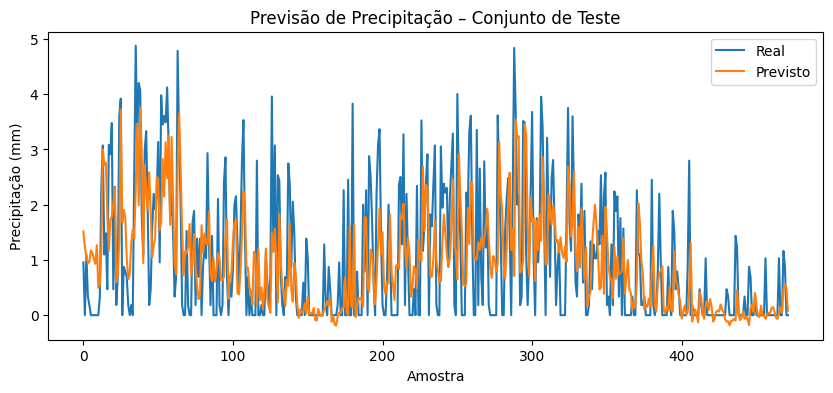

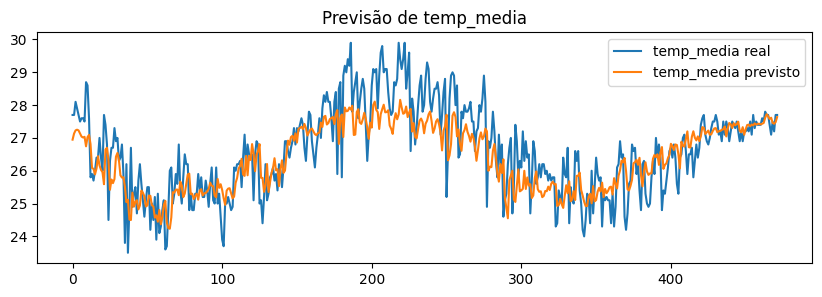

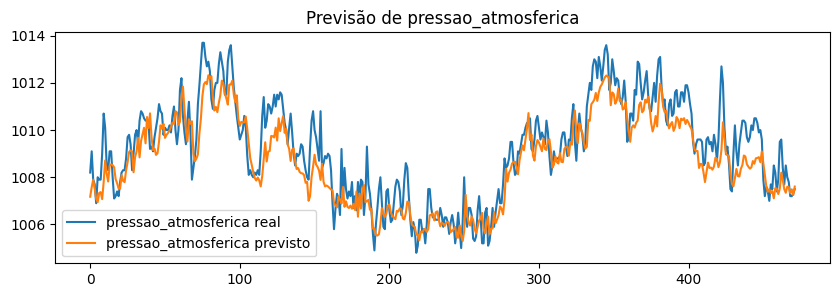

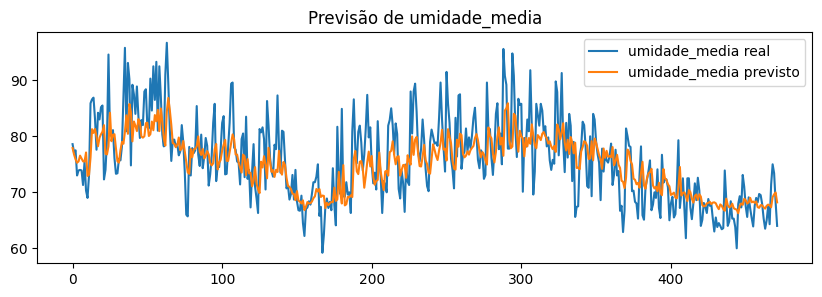

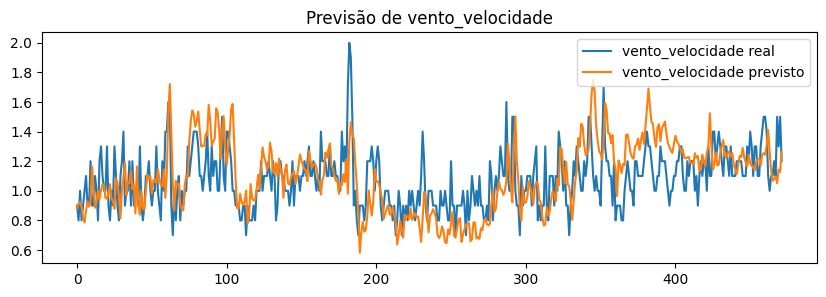

In [ ]:
plt.figure(figsize=(10,4))
plt.plot(y_true[:,0], label='Real')
plt.plot(y_pred[:,0], label='Previsto')
plt.title('Previsão de Precipitação – Conjunto de Teste')
plt.xlabel('Amostra')
plt.ylabel('Precipitação (mm)')
plt.legend()
plt.show()

# 3.2) Se quiser outras variáveis:
for i, var in enumerate(target_vars[1:], start=1):
    plt.figure(figsize=(10,3))
    plt.plot(y_true[:,i], label=f'{var} real')
    plt.plot(y_pred[:,i], label=f'{var} previsto')
    plt.title(f'Previsão de {var}')
    plt.legend()
    plt.show()

(14, 9)
            precipitacao_mm  temp_media  pressao_atmosferica  umidade_media  \
2025-01-02         0.389973   28.095202          1006.380160      69.963468   
2025-01-03         0.589795   27.986071          1006.148641      70.700839   
2025-01-04         0.643817   27.972926          1006.011463      70.836634   
2025-01-05         0.639374   28.002046          1005.964877      70.957652   
2025-01-06         0.601260   28.043116          1005.951796      70.975472   
2025-01-07         0.585530   28.061691          1005.936300      70.961505   
2025-01-08         0.584931   28.067532          1005.922719      70.978664   
2025-01-09         0.556385   28.092847          1005.951599      70.777054   
2025-01-10         0.573873   28.088635          1005.944588      70.781509   
2025-01-11         0.599494   28.085170          1005.937460      70.825750   
2025-01-12         0.618910   28.088659          1005.932655      70.860279   
2025-01-13         0.627440   28.100066     

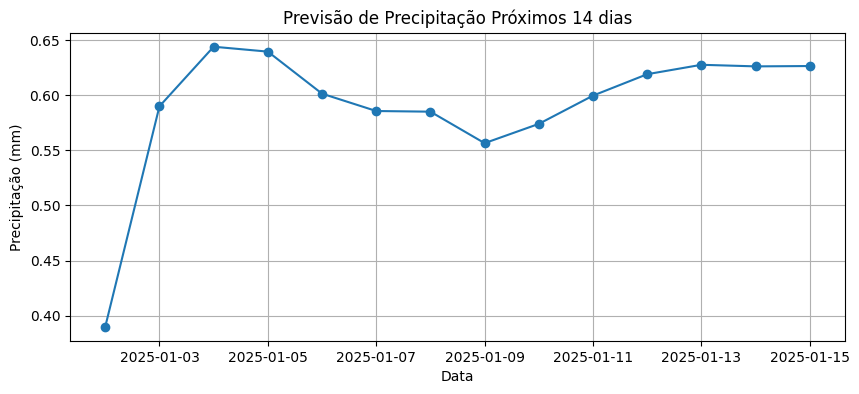

In [ ]:
# 4.1) Chame apenas a previsão
previsao = sistema.prever_multivariate(dias=14)

# 4.2) Inspecione o DataFrame
print(previsao.shape)       # deve ser (14, número de colunas)
print(previsao.head(15))      # primeiras linhas
print(previsao.isna().sum())# verificar NaNs

# 4.3) Plote a série futura de precipitação
plt.figure(figsize=(10,4))
plt.plot(previsao.index, previsao['precipitacao_mm'], marker='o')
plt.title('Previsão de Precipitação Próximos 14 dias')
plt.xlabel('Data')
plt.ylabel('Precipitação (mm)')
plt.grid(True)
plt.show()

In [ ]:
# Executar análise completa
sistema, mapa_interativo, relatorio = executar_analise_espacial_realista('/content/dados_A320_D_2015-01-01_2025-01-01.csv')

# Visualizar mapa interativo
mapa_interativo

# Gerar relatório
print("\n=== RELATÓRIO COMPLETO ===")
print(f"Período: {relatorio['resumo_geral']['periodo_previsao']}")
print(f"Total precipitação prevista: {relatorio['resumo_geral']['total_precipitacao_prevista']:.2f} mm")
print(f"Dias com risco alto: {relatorio['analise_riscos']['dias_com_risco_alto']}")

# Visualizar diferentes dias
for i in range(5):
    dia = sistema.previsao.index[i]
    print(f"\nGenerating map for {dia.strftime('%Y-%m-%d')}...")
    mapa = sistema.visualizar_mapa_risco_interativo(dia)
    display(mapa)

Preparando análise espacial...
Baixando DEM para João Pessoa...
Processando DEM...
Iniciando processamento hidrológico...
Preenchendo depressões...
Calculando direção do fluxo...
Calculando acumulação de fluxo...
Processamento hidrológico concluído!
Epoch 1/100
120/120 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0656 - val_loss: 0.0235 - learning_rate: 0.0010
Epoch 2/100
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0269 - val_loss: 0.0208 - learning_rate: 0.0010
Epoch 3/100
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0265 - val_loss: 0.0217 - learning_rate: 0.0010
Epoch 4/100
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0275 - val_loss: 0.0211 - learning_rate: 0.0010
Epoch 5/100
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0255 - val_loss: 0.0207 - learning_rate: 0.0010
Epoch 6/100
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - loss: 0.0251 - val_loss: 0.0200 - learning_rate: 0.0010
Epoch 7/100
120/120 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 0.0236 - val_loss: 0.0


Generating map for 2025-01-03...
Usando dados de previsão - Precipitação: 0.59mm
Precipitação muito baixa (0.59mm). Nenhuma inundação mostrada.
Nenhuma área de inundação identificada para esta quantidade de precipitação.



Generating map for 2025-01-04...
Usando dados de previsão - Precipitação: 0.64mm
Precipitação muito baixa (0.64mm). Nenhuma inundação mostrada.
Nenhuma área de inundação identificada para esta quantidade de precipitação.



Generating map for 2025-01-05...
Usando dados de previsão - Precipitação: 0.64mm
Precipitação muito baixa (0.64mm). Nenhuma inundação mostrada.
Nenhuma área de inundação identificada para esta quantidade de precipitação.



Generating map for 2025-01-06...
Usando dados de previsão - Precipitação: 0.60mm
Precipitação muito baixa (0.60mm). Nenhuma inundação mostrada.
Nenhuma área de inundação identificada para esta quantidade de precipitação.


# Chuva Moderada Alta

In [ ]:
sistema = SistemaMonitoramentoEspacial()

sistema.carregar_dados_completos(df)

sistema.preparar_analise_espacial()

dias_moderados = sistema.dados[(sistema.dados['precipitacao_mm'] >= 30) &
                               (sistema.dados['precipitacao_mm'] <= 50)]

if not dias_moderados.empty:
    dia_moderado = dias_moderados.index[0]
    precip_moderada = sistema.dados.loc[dia_moderado, 'precipitacao_mm']

    print(f"Dia com chuva moderada selecionado: {dia_moderado.date()}")
    print(f"Precipitação: {precip_moderada:.1f} mm")


mapa_moderado = sistema.visualizar_mapa_risco_interativo(dia_moderado)
mapa_moderado

Baixando DEM para João Pessoa...
Processando DEM...
Iniciando processamento hidrológico...
Preenchendo depressões...
Calculando direção do fluxo...
Calculando acumulação de fluxo...
Processamento hidrológico concluído!
Dia com chuva moderada selecionado: 2015-06-29
Precipitação: 48.2 mm
Usando dados históricos - Precipitação: 48.20mm
Limiar de fluxo: 200.0
Pontos de inundação encontrados: 29172


#Chuva muito forte

In [ ]:
sistema = SistemaMonitoramentoEspacial()

sistema.carregar_dados_completos(df)

sistema.preparar_analise_espacial()

dia_max = sistema.dados['precipitacao_mm'].idxmax()
precip_max = sistema.dados.loc[dia_max, 'precipitacao_mm']
print(f"Maior precipitação: {precip_max:.1f} mm em {dia_max.date()}")

mapa_max = sistema.visualizar_mapa_risco_interativo(dia_max)
mapa_max

Baixando DEM para João Pessoa...
Processando DEM...
Iniciando processamento hidrológico...
Preenchendo depressões...
Calculando direção do fluxo...
Calculando acumulação de fluxo...
Processamento hidrológico concluído!
Maior precipitação: 190.2 mm em 2019-06-14
Usando dados históricos - Precipitação: 190.20mm
Limiar de fluxo: 101.4
Pontos de inundação encontrados: 42883


# Função Auxiliares

In [ ]:
file_path = "/content/dados_A320_D_2015-01-01_2025-01-01.csv"

df_raw = pd.read_csv(
    file_path,
    sep=';',
    decimal=',',
    skiprows=10,
    engine='python',
    header=0
)

# 2) Elimina a coluna extra (última) que está sempre vazia
df_raw = df_raw.iloc[:, :-1]

# 3) Agora renomeia suas 11 colunas corretamente:
df_raw.columns = [
    'data',
    'precipitacao_mm',
    'pressao_atmosferica',
    'ponto_orvalho',
    'temp_maxima',
    'temp_media',
    'temp_minima',
    'umidade_media',
    'umidade_minima',
    'vento_rajada',
    'vento_velocidade'
]

for col in df_raw.columns[1:]:
    df_raw[col] = pd.to_numeric(df_raw[col].astype(str).str.replace(',', '.'), errors='coerce')

df_raw['data'] = pd.to_datetime(df_raw['data'], format='%Y-%m-%d', errors='coerce')
df_raw = df_raw.dropna(subset=['data']).reset_index(drop=True)

# 6) Confira
print(df_raw.shape)
print(df_raw.dtypes)
print(df_raw.head())

(3654, 11)
data                   datetime64[ns]
precipitacao_mm               float64
pressao_atmosferica           float64
ponto_orvalho                 float64
temp_maxima                   float64
temp_media                    float64
temp_minima                   float64
umidade_media                 float64
umidade_minima                float64
vento_rajada                  float64
vento_velocidade              float64
dtype: object
        data  precipitacao_mm  pressao_atmosferica  ponto_orvalho  \
0 2015-01-01              NaN               1010.2           21.9   
1 2015-01-02              0.0               1010.0           22.4   
2 2015-01-03              0.0               1009.5           20.8   
3 2015-01-04              0.0               1010.8           20.0   
4 2015-01-05              0.0               1011.8           21.2   

   temp_maxima  temp_media  temp_minima  umidade_media  umidade_minima  \
0         31.0        26.2         24.7           78.4            52

Epoch 1/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 6s 19ms/step - loss: 0.0646 - val_loss: 0.0266 - learning_rate: 0.0010
Epoch 2/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 0.0297 - val_loss: 0.0251 - learning_rate: 0.0010
Epoch 3/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0290 - val_loss: 0.0240 - learning_rate: 0.0010
Epoch 4/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0279 - val_loss: 0.0222 - learning_rate: 0.0010
Epoch 5/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0254 - val_loss: 0.0214 - learning_rate: 0.0010
Epoch 6/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0258 - val_loss: 0.0200 - learning_rate: 0.0010
Epoch 7/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0252 - val_loss: 0.0209 - learning_rate: 0.0010
Epoch 8/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0244 - val_loss: 0.0195 - learning_rate: 0.0010
Epoch 9/100
107/107 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 0.0228 - val_loss: 0.0198 - learning_rate: 0.0010


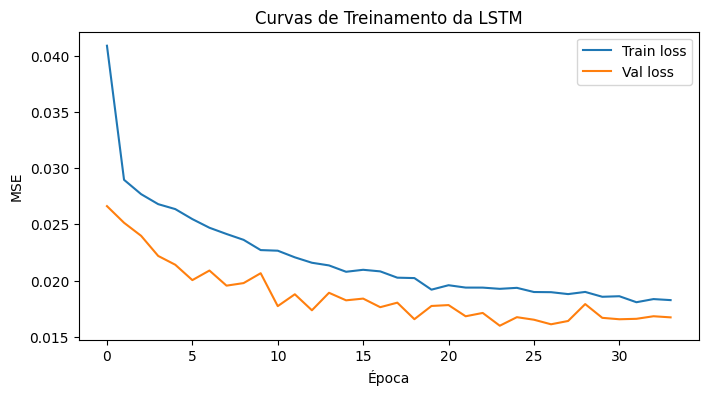

In [ ]:
sistema = SistemaMonitoramentoEspacial()
df = sistema.carregar_dados_completos(df_raw)

history = sistema.treinar_modelo_multivariate()

import matplotlib.pyplot as plt

plt.figure(figsize=(8,4))
plt.plot(history.history['loss'],  label='Train loss')
plt.plot(history.history['val_loss'],label='Val loss')
plt.title('Curvas de Treinamento da LSTM')
plt.xlabel('Época')
plt.ylabel('MSE')
plt.legend()
plt.show()
